# Análisis Exploratorio de Datos (EDA): 

## Objetivo
Este notebook contiene el análisis exploratorio completo del dataset, siguiendo una estructura organizada y metódica para entender los datos, limpiarlos y prepararlos para modelado.

## Contenido
1. Configuración Inicial y librearías
2. Carga y Vista General de los Datos
3. Limpieza y Preprocesamiento
4. Análisis Univariante
5. Análisis Bivariante
6. Feature Engineering
7. Conclusiones

# 1. Configuración Inicial

Importamos las bibliotecas necesarias y configuramos el entorno de trabajo.


In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import missingno as msno
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import os


### Configuración del estilo visual

In [5]:

sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (6, 4)
%matplotlib inline

In [6]:
print("Librerías importadas y configuración realizada.") 

Librerías importadas y configuración realizada.


### Configuración de pandas

In [ ]:
pd.set_option('display.max_rows', 100) 
pd.set_option('display.max_columns', None) 


pd.set_option('display.width', None)        # No limit on display width
pd.set_option('display.expand_frame_repr', False)  # Prevent wrapping

# 2. Carga y Preparación de los Datos

### Cargamos el dataset y realizamos una inspección inicial para entender su estructura.


In [8]:
# Setting paths
current_dir = os.getcwd()  # Use os.getcwd() to get the current working directory
parent_dir = os.path.dirname(current_dir)
data_dir = os.path.join(parent_dir, "data")
file_path = os.path.join(data_dir, "")

raw_data_csv_path = os.path.join(data_dir, "raw_data.csv")
#----------------------------------------------------------------------------------------------------
# Creating dataframes
df_raw_data_sugar= pd.read_csv(raw_data_csv_path)

df_raw_data_sugar.head()


,Country,Year,Country_Code,Continent,Region,Population,GDP_Per_Capita,Per_Capita_Sugar_Consumption,Total_Sugar_Consumption,Sugar_From_Sugarcane,Sugar_From_Beet,Sugar_From_HFCS,Sugar_From_Other,Processed_Food_Consumption,Avg_Daily_Sugar_Intake,Diabetes_Prevalence,Obesity_Rate,Sugar_Imports,Sugar_Exports,Avg_Retail_Price_Per_Kg,Gov_Tax,Gov_Subsidies,Education_Campaign,Urbanization_Rate,Climate_Conditions,Sugarcane_Production_Yield
0,France,1972,FRA,Europe,Western Europe,2.617306e+08,8692.631696,12.827741,3.357413e+06,68.422963,38.600384,42.970760,-49.994107,171.966182,35.148009,11.495111,34.094017,5.401670e+06,2.358929e+06,3.864020,0.0,0,0.0,34.503398,3,52.433972
1,Australia,2003,AUS,Oceania,Australia & New Zealand,1.737965e+08,6859.195960,21.362632,3.712750e+06,55.432564,38.463620,16.223681,-10.119866,229.238022,58.533611,6.517479,16.040118,3.418790e+06,9.694348e+06,3.282101,0.0,0,0.0,31.783067,4,58.382055
2,Germany,1963,DEU,Europe,Western Europe,1.236366e+08,22075.950575,32.077485,3.965951e+06,86.466120,10.001416,51.720631,-48.188167,203.263252,87.892309,8.252688,14.405741,8.987281e+06,5.451632e+06,1.097687,0.0,0,0.0,51.551345,1,32.184735
3,France,1965,FRA,Europe,Western Europe,2.989961e+08,3728.027392,47.648930,1.424685e+07,69.806707,34.005173,43.573774,-47.385654,34.177283,130.558067,10.997905,38.499271,5.179004e+06,8.048500e+06,2.761297,0.0,0,0.0,80.386281,2,84.296019
4,Germany,2010,DEU,Europe,Western Europe,7.341531e+06,40420.973962,23.214343,1.704288e+05,63.772278,23.105924,53.543595,-40.421797,78.733482,63.607299,14.893879,36.190977,6.463439e+06,7.062910e+06,4.219431,0.0,0,1.0,49.701153,3,66.110815


### Vista general del dataset

In [17]:

# información de los datos
df_raw_data_sugar.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 26 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   country                       10000 non-null  object 
 1   year                          10000 non-null  int64  
 2   country_code                  10000 non-null  object 
 3   continent                     10000 non-null  object 
 4   region                        10000 non-null  object 
 5   population                    10000 non-null  float64
 6   gdp_per_capita                10000 non-null  float64
 7   per_capita_sugar_consumption  10000 non-null  float64
 8   total_sugar_consumption       10000 non-null  float64
 9   sugar_from_sugarcane          10000 non-null  float64
 10  sugar_from_beet               10000 non-null  float64
 11  sugar_from_hfcs               10000 non-null  float64
 12  sugar_from_other              10000 non-null  float64
 13  pr

# 3. Limpieza y Preprocesamiento

### Limpieza de Nombres de Columnas y Valores Faltantes

In [ ]:
# Limpieza de nombres de columnas
df_raw_data_sugar.columns= df_raw_data_sugar.columns.str.lower().str.strip() # First, let's clean the spaces

In [11]:
def check_missing_data(df):
    nulls = df.isnull().sum()
    null_percentage = (nulls / len(df) * 100)
    missing_data = pd.DataFrame({
        'Missing Values': nulls,
        'Percentage': null_percentage
    })
    return missing_data.sort_values('Missing Values', ascending=False)

missing_data = check_missing_data(df_raw_data_sugar)
print("Análisis de valores faltantes:")
print(missing_data[missing_data['Missing Values'] > 0])
# Visualizar los datos faltantes  


Análisis de valores faltantes:
                    Missing Values  Percentage
gov_tax                        531        5.31
education_campaign             520        5.20


### Detección de duplicados

In [106]:
def check_duplicates(df_raw_data_sugar, subset=None):
    dups = df_raw_data_sugar[df_raw_data_sugar.duplicated(subset=subset, keep=False)]
    pd.set_option('display.max_rows', 5) 
    print(f"Duplicates ({len(dups)}):\n{dups}" if not dups.empty else "No duplicates found.")

check_duplicates(df_raw_data_sugar) 

No duplicates found.


### Búsqueda de valores desconocidos

In [107]:

def check_unknowns(df_raw_data_sugar):
    unknown_variants = ['unknown', 'Unknown', 'UNK', 'unk', 'n/a', 'N/A', 'na', 'NA']
    found = False
    
    for col in df_raw_data_sugar.columns:
        if df_raw_data_sugar[col].astype(str).isin(unknown_variants).any():
            print(f"⚠️ Se encontraron valores 'unknown' en la columna: {col}")
            found = True

    if not found:
        print("✅ No se encontraron valores 'unknown', 'n/a' o similares en ninguna columna.")

# Llamas a la función así:
check_unknowns(df_raw_data_sugar)


✅ No se encontraron valores 'unknown', 'n/a' o similares en ninguna columna.


Resultado: no se encontraron valores nulos o desconocidos.

## Análisis de valores faltantes

En esta sección, analizamos los valores faltantes en el dataset para entender su distribución y decidir cómo manejarlos.


#### 1.Porcentaje de valores NaN por columna 
El porcentaje de valores `NaN` por columna nos ayuda a identificar qué variables tienen datos faltantes y en qué proporción. Esto es útil para decidir si debemos eliminar columnas, imputar valores o manejar los datos faltantes de otra manera.


In [ ]:

nan_percentages = (df_raw_data_sugar.isnull().sum() / len(df_raw_data_sugar)) * 100
print("\nPorcentaje de valores NaN por columna:\n", nan_percentages)


Porcentaje de valores NaN por columna:
 Country                         0.00
Year                            0.00
Country_Code                    0.00
Continent                       0.00
Region                          0.00
Population                      0.00
GDP_Per_Capita                  0.00
Per_Capita_Sugar_Consumption    0.00
Total_Sugar_Consumption         0.00
Sugar_From_Sugarcane            0.00
Sugar_From_Beet                 0.00
Sugar_From_HFCS                 0.00
Sugar_From_Other                0.00
Processed_Food_Consumption      0.00
Avg_Daily_Sugar_Intake          0.00
Diabetes_Prevalence             0.00
Obesity_Rate                    0.00
Sugar_Imports                   0.00
Sugar_Exports                   0.00
Avg_Retail_Price_Per_Kg         0.00
Gov_Tax                         5.31
Gov_Subsidies                   0.00
Education_Campaign              5.20
Urbanization_Rate               0.00
Climate_Conditions              0.00
Sugarcane_Production_Yield      0.

Resultado: Gov_Tax y Education_campaing tienen porcentaje de valores NaN.

### Porcentaje de NaN por país y por región

In [16]:
for cat_col in ['Country', 'Continent', 'Region']:
    print(f"\nPorcentaje de NaN en 'Gov_Tax' por {cat_col}:")
    print(df_raw_data_sugar.groupby(cat_col)['Gov_Tax'].apply(lambda x: x.isnull().sum() / len(x) * 100))

    print(f"\nPorcentaje de NaN en 'Education_Campaign' por {cat_col}:")
    print(df_raw_data_sugar.groupby(cat_col)['Education_Campaign'].apply(lambda x: x.isnull().sum() / len(x) * 100))


Porcentaje de NaN en 'Gov_Tax' por Country:
Country
Australia       4.143948
Brazil          5.837563
China           4.893350
France          4.994193
Germany         5.168269
India           5.548854
Indonesia       4.446978
Japan           5.673759
Mexico          5.731707
Russia          5.630355
South Africa    5.514706
USA             6.375000
Name: Gov_Tax, dtype: float64

Porcentaje de NaN en 'Education_Campaign' por Country:
Country
Australia       4.252999
Brazil          4.441624
China           5.144291
France          4.645761
Germany         5.408654
India           4.221954
Indonesia       5.245154
Japan           5.437352
Mexico          5.853659
Russia          5.263158
South Africa    6.250000
USA             6.375000
Name: Education_Campaign, dtype: float64

Porcentaje de NaN en 'Gov_Tax' por Continent:
Continent
Africa           5.514706
Asia             5.135861
Europe           5.258964
North America    6.049383
Oceania          4.143948
South America    5.837563

### Visualización de valores faltantes

En esta sección, utilizamos la biblioteca `missingno` para analizar los valores faltantes en el dataset. Estas visualizaciones nos ayudan a identificar patrones de valores faltantes y su relación con otras columnas.

#### 1. Matriz de valores faltantes
La matriz de valores faltantes muestra la presencia o ausencia de datos en cada columna. Esto es útil para identificar patrones de valores faltantes y su distribución en el dataset.


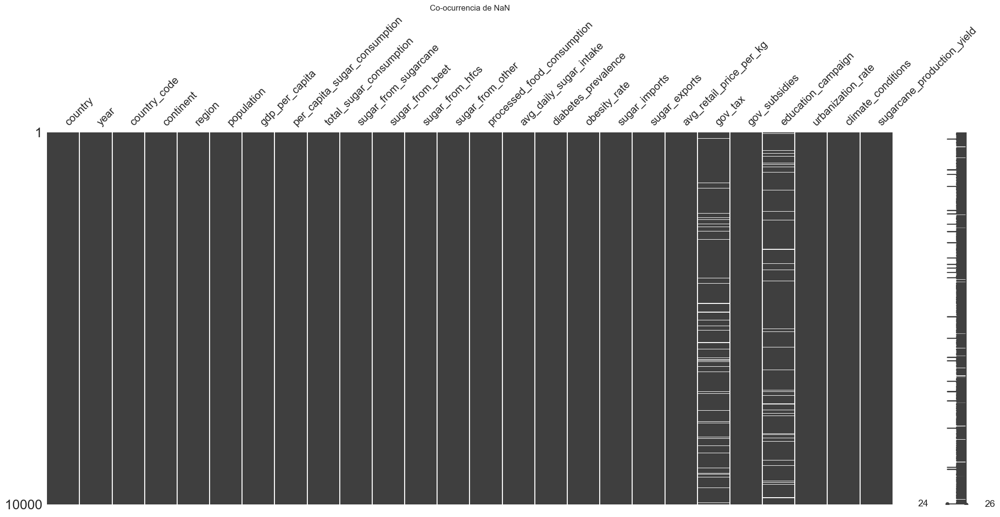

In [108]:
import missingno as msno
import matplotlib.pyplot as plt

msno.matrix(df_raw_data_sugar)
plt.title('Co-ocurrencia de NaN')
plt.show()



#### 2. Mapa de calor de correlación de nulidad
El mapa de calor de correlación de nulidad muestra la relación entre las columnas en términos de valores faltantes. Si dos columnas tienen una alta correlación de nulidad, significa que tienden a tener valores faltantes en los mismos registros.

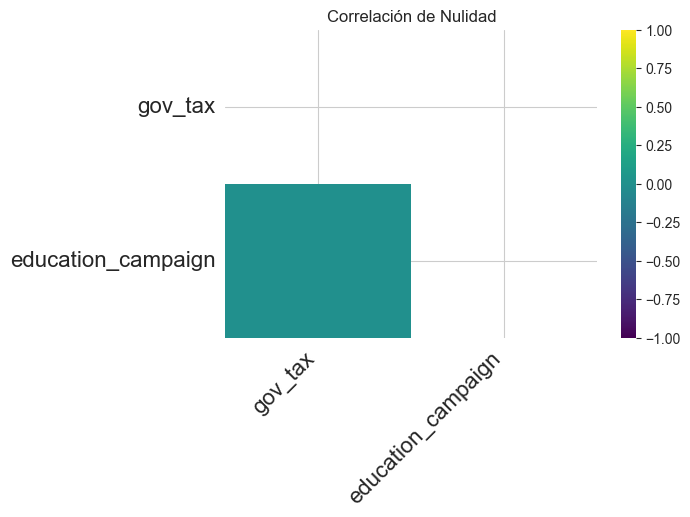

In [109]:
msno.heatmap(df_raw_data_sugar, figsize=(6, 4), cmap='viridis')
plt.title('Correlación de Nulidad')
plt.show()

Resultado: Ambos gráficos indican que no hay una relación relevante entre las variables en términos de valores faltantes. Esto implica que los valores `NaN` pueden ser tratados de manera independiente para cada columna.


### Análisis de valores faltantes en `Gov_Tax` por año

En esta sección, analizamos la frecuencia de valores faltantes (`NaN`) en la columna `Gov_Tax`, agrupados por año. Esto nos ayuda a identificar si los valores faltantes están concentrados en ciertos períodos de tiempo.

In [ ]:

df_raw_data_sugar['Year'] = pd.to_datetime(df_raw_data_sugar['Year'], format='%Y', errors='coerce')

if 'Gov_Tax' in df_raw_data_sugar.columns and 'Year' in df_raw_data_sugar.columns:
    nan_gov_tax_by_year = df_raw_data_sugar[df_raw_data_sugar['Gov_Tax'].isnull()]['Year'].dt.year.value_counts().sort_index()
    print("\nFrecuencia de NaN en 'Gov_Tax' por año:\n", nan_gov_tax_by_year)
else:
    print("\nNo se encontraron las columnas 'Gov_Tax' o 'Year'.")




Frecuencia de NaN en 'Gov_Tax' por año:
 Year
1960    12
1961    10
1962    10
1963    12
1964     8
1965     4
1966     9
1967     8
1968    11
1969     7
1970     3
1971    11
1972     3
1973     6
1974     9
1975     6
1976     8
1977     6
1978     7
1979     6
1980    17
1981     9
1982     9
1983    14
1984     8
1985    10
1986     4
1987     7
1988    10
1989     7
1990     8
1991    10
1992     2
1993     8
1994     7
1995     7
1996     8
1997     9
1998    12
1999     6
2000     2
2001    12
2002     8
2003     9
2004     8
2005     6
2006     7
2007    16
2008    12
2009     7
2010    11
2011     8
2012     5
2013    11
2014     8
2015    10
2016     6
2017     9
2018     9
2019     5
2020     8
2021    13
2022     8
2023     5
Name: count, dtype: int64


Resultado: Este análisis sugiere que los valores faltantes en `Gov_Tax` no están concentrados en un período específico, pero algunos años tienen una cantidad significativamente mayor de datos faltantes. Esto podría deberse a problemas en la recopilación de datos durante esos años. Dependiendo de la importancia de esta columna, se pueden imputar los valores faltantes o excluir los años con más datos faltantes del análisis.

#### Análisis de NaN en 'Education_Campaign' por año

In [ ]:

if 'Education_Campaign' in df_raw_data_sugar.columns and 'Year' in df_raw_data_sugar.columns:
    nan_education_by_year = df_raw_data_sugar[df_raw_data_sugar['Education_Campaign'].isnull()]['Year'].dt.year.value_counts().sort_index()
    print("\nFrecuencia de NaN en 'Education_Campaign' por año:\n", nan_education_by_year)
else:
    print("\nNo se encontraron las columnas 'Education_Campaign' o 'Year'.")


Frecuencia de NaN en 'Education_Campaign' por año:
 Year
1960    10
1961    12
1962     7
1963     6
1964     9
1965    13
1966     6
1967     3
1968     4
1969     5
1970     4
1971    11
1972     6
1973     4
1974     8
1975     4
1976    10
1977     5
1978    11
1979     6
1980     3
1981     6
1982     6
1983    10
1984    14
1985    13
1986     9
1987     8
1988     9
1989     7
1990    14
1991    22
1992     9
1993     9
1994    15
1995     9
1996     9
1997    11
1998     5
1999    11
2000     6
2001     6
2002     4
2003    12
2004     7
2005     7
2006     5
2007     6
2008     5
2009     7
2010     5
2011     7
2012     7
2013    10
2014    11
2015     4
2016    14
2017     3
2018    12
2019     6
2020     9
2021     6
2022     9
2023     9
Name: count, dtype: int64


In [25]:
for country in df_raw_data_sugar['Country'].unique():
    nan_by_year_country_edu = df_raw_data_sugar[df_raw_data_sugar['Country'] == country]['Year'][df_raw_data_sugar['Education_Campaign'].isnull()].dt.year.value_counts().sort_index()
    if not nan_by_year_country_edu.empty:
        print(f"\nFrecuencia de NaN en 'Education_Campaign' por año para {country}:\n", nan_by_year_country_edu)


Frecuencia de NaN en 'Education_Campaign' por año para France:
 Year
1961    2
1965    3
1968    1
1972    2
1973    1
1975    1
1978    2
1985    1
1988    2
1990    2
1991    2
1993    1
1997    1
2002    2
2003    2
2006    1
2008    1
2011    1
2012    1
2016    2
2018    1
2019    1
2020    2
2021    2
2022    2
2023    1
Name: count, dtype: int64

Frecuencia de NaN en 'Education_Campaign' por año para Australia:
 Year
1961    1
1964    1
1966    2
1970    1
1976    1
1977    1
1978    3
1981    2
1983    1
1984    2
1987    1
1988    1
1989    1
1990    1
1991    5
1994    1
1996    1
1997    1
1999    2
2002    1
2003    1
2004    1
2007    1
2011    1
2012    1
2013    1
2014    1
2016    1
2019    1
Name: count, dtype: int64

Frecuencia de NaN en 'Education_Campaign' por año para Germany:
 Year
1961    1
1964    3
1965    1
1966    1
1968    1
1969    1
1972    3
1973    1
1974    2
1976    1
1979    1
1980    1
1981    1
1982    1
1983    1
1984    2
1987    1
1988    1
1991

### Análisis de valores faltantes en `Education_Campaign` por país y año

En esta sección, analizamos la cantidad de valores faltantes (`NaN`) en la columna `Education_Campaign`, agrupados por país y año. Esto nos ayuda a identificar si los valores faltantes están concentrados en ciertos países o períodos de tiempo.

In [ ]:
pd.set_option('display.max_rows', None)

if 'Education_Campaign' in df_raw_data_sugar.columns and 'Year' in df_raw_data_sugar.columns and 'Country' in df_raw_data_sugar.columns:
    nan_education_by_year_country_all = df_raw_data_sugar.groupby(['Country', 'Year'])['Education_Campaign'].apply(lambda x: x.isnull().sum())
    print("\nCantidad de NaN en 'Education_Campaign' por país y año (mostrando todos los casos):\n")
    print(nan_education_by_year_country_all[nan_education_by_year_country_all > 0])
else:
    print("\nNo se encontraron las columnas 'Education_Campaign', 'Year' o 'Country'.")



Cantidad de NaN en 'Education_Campaign' por país y año (mostrando todos los casos):

Country       Year      
Australia     1961-01-01    1
              1964-01-01    1
              1966-01-01    2
              1970-01-01    1
              1976-01-01    1
              1977-01-01    1
              1978-01-01    3
              1981-01-01    2
              1983-01-01    1
              1984-01-01    2
              1987-01-01    1
              1988-01-01    1
              1989-01-01    1
              1990-01-01    1
              1991-01-01    5
              1994-01-01    1
              1996-01-01    1
              1997-01-01    1
              1999-01-01    2
              2002-01-01    1
              2003-01-01    1
              2004-01-01    1
              2007-01-01    1
              2011-01-01    1
              2012-01-01    1
              2013-01-01    1
              2014-01-01    1
              2016-01-01    1
              2019-01-01    1
Brazil        1961-

#### Casos con mayor cantidad de valores faltantes

En este análisis, identificamos los casos donde la cantidad de valores faltantes (`NaN`) es mayor. Estos picos podrían ser indicativos de problemas específicos en la recopilación de datos durante ciertos años en algunos países.

**Casos destacados:**
- **Australia en 1991**: 5 valores faltantes.
- **India en 1991**: 5 valores faltantes.
- **Indonesia en 1984**: 4 valores faltantes.
- **México en 1991**: 4 valores faltantes.
- **USA en 2016**: 4 valores faltantes.
- **South Africa**:
  - 1965: 3 valores faltantes.
  - 1985: 3 valores faltantes.
  - 2022: 3 valores faltantes.
- **Brasil**:
  - 1977: 3 valores faltantes.
  - 1985: 3 valores faltantes.
- **China**:
  - 1960: 3 valores faltantes.
  - 1961: 3 valores faltantes.
  - 1991: 3 valores faltantes.

Estos picos de valores faltantes podrían deberse a problemas específicos en la recopilación de datos durante esos años en los países mencionados. Es importante considerar si estos valores faltantes deben ser imputados o si los años con más datos faltantes deben ser excluidos del análisis.

#### Contexto histórico relacionado con los valores faltantes

Los valores faltantes (`NaN`) están dispersos a lo largo de los años (1960-2023) con cierta variabilidad anual, sin una tendencia clara. Sin embargo, algunos eventos históricos y sociales pueden ayudar a contextualizar los datos faltantes, especialmente en años clave como 1991.

**Australia en 1991**:
- En 1991, la **Organización Mundial de la Salud (OMS)** y la **Federación Internacional de la Diabetes (FID)** crearon el **Día Mundial de la Diabetes** para concientizar sobre esta enfermedad.
- Ese mismo año, se estableció por primera vez el **National Diabetes Strategy (Estrategia Nacional para la Diabetes)** en Australia.
- Antes de 1991, la educación sobre diabetes existía, pero era regional, limitada y fragmentada.

**India en 1991**:
- Debido al aumento de casos de diabetes en la India, se fundaron:
  - **Lifeline Express**: Un tren-hospital lanzado en 1991 que ofrecía atención médica, incluida la relacionada con la diabetes, en zonas rurales.
  - **Dr. Mohan’s Diabetes Centre**: Fundado en 1991 en Chennai, se convirtió en un referente en tratamiento y educación sobre diabetes.

Estos eventos reflejan un aumento en la atención global hacia la diabetes en 1991, lo que podría haber influido en la recopilación de datos o en la priorización de recursos en ciertos países y regiones.

### Imputación de valores faltantes

Traer aquí el código de la rama de Orlando

### Eliminación de columnas redundantes. 
Investigar si la columna region es relevante para el análisis

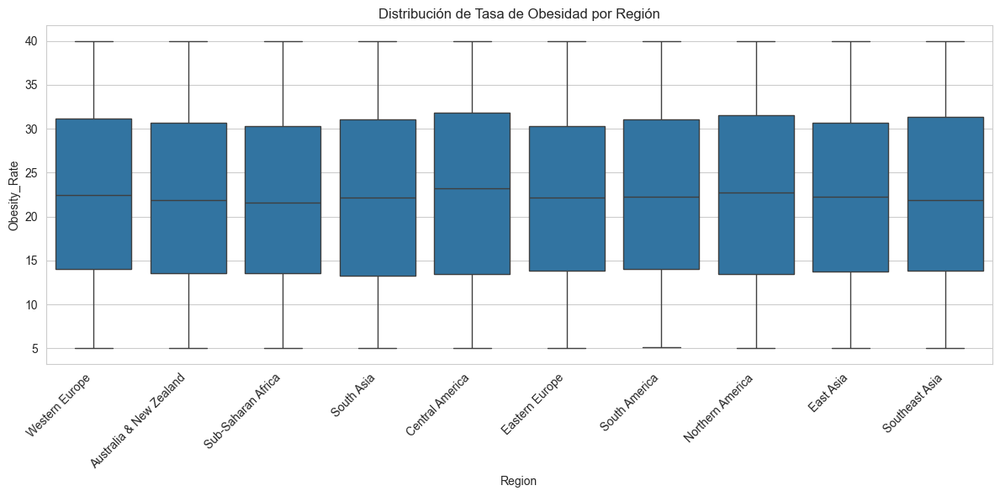

In [30]:
if 'Region' in df_raw_data_sugar.columns and 'Obesity_Rate' in df_raw_data_sugar.columns:
    plt.figure(figsize=(12, 6))
    sns.boxplot(x='Region', y='Obesity_Rate', data=df_raw_data_sugar)
    plt.title('Distribución de Tasa de Obesidad por Región')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

Resultado: El gráfico nos enseña que la obesidad es bastante parecida en todas las regiones grandes que muestra. Los niveles típicos, los valores medios y qué tanto varían los datos de obesidad son muy similares entre las regiones. Esto quiere decir que la "Región" no nos ayuda mucho a separar países con niveles de obesidad muy distintos, así que probablemente no sea muy útil para predecir la obesidad por país. Las regiones grandes no muestran las diferencias importantes en cuánta obesidad hay en los países.

#### Verificar la Redundancia con la Columna country

In [37]:
country_code_unique_per_country = df_raw_data_sugar.groupby('Country')['Country_Code'].nunique()
if (country_code_unique_per_country > 1).any():
    print("Advertencia: Algunos países tienen múltiples códigos.")
else:
    print("Cada país tiene un único código asociado.")



Cada país tiene un único código asociado.


#### Verificar la unicidad de los países por código

In [38]:
country_unique_per_country_code = df_raw_data_sugar.groupby('Country_Code')['Country'].nunique()
if (country_unique_per_country_code > 1).any():
    print("Advertencia: Algunos códigos corresponden a múltiples países.")
else:
    print("Cada código corresponde a un único país.")

print("\nEjemplos de correspondencia País - Código:")
print(df_raw_data_sugar[['Country', 'Country_Code']].head())

Cada código corresponde a un único país.

Ejemplos de correspondencia País - Código:
     Country Country_Code
0     France          FRA
1  Australia          AUS
2    Germany          DEU
3     France          FRA
4    Germany          DEU


La columna 'country_code' contiene la misma información que la columna 'Country', pero en forma de código. Como cada país tiene un único código y viceversa, 'country_code' es redundante para nuestro análisis a nivel de país y puede eliminarse sin perder información importante para el modelado.

Resultado: Tanto 'Region' como 'country_code' son columnas que aportan información redundante o no esencial para nuestro análisis predictivo a nivel de país, por lo que pueden ser eliminadas para simplificar el dataset.

In [40]:
df_raw_data_sugar = df_raw_data_sugar.drop(columns=['Region', 'Country_Code'])

#### Guardamos el nuevo csv

In [49]:
file_path = 'cleaned_data_sugar.csv'

df_raw_data_sugar.to_csv(file_path, index=False)

print(f"El DataFrame limpio se ha guardado como: {file_path}")

El DataFrame limpio se ha guardado como: cleaned_data_sugar.csv


In [ ]:
df = df_raw_data_sugar.drop(columns=['Region'])
print(df.columns)

In [18]:
df_cleaned = df_raw_data_sugar.dropna(subset=['gov_tax', 'education_campaign'])


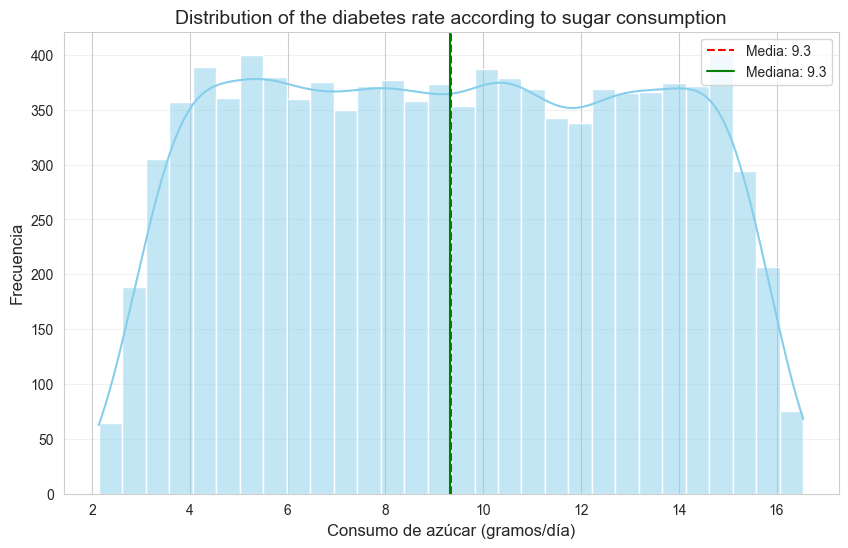

In [24]:


plt.figure(figsize=(10, 6))
sns.histplot(df_raw_data_sugar["diabetes_prevalence"], kde=True, bins=30, color='skyblue')
plt.title("Distribution of the diabetes rate according to sugar consumption", fontsize=14)
plt.xlabel("Consumo de azúcar (gramos/día)", fontsize=12)
plt.ylabel("Frecuencia", fontsize=12)

# Añadir media y mediana
mean = df_raw_data_sugar["diabetes_prevalence"].mean()
median = df_raw_data_sugar["diabetes_prevalence"].median()
plt.axvline(mean, color='red', linestyle='--', label=f'Media: {mean:.1f}')
plt.axvline(median, color='green', linestyle='-', label=f'Mediana: {median:.1f}')

plt.legend()
plt.grid(axis='y', alpha=0.3)
plt.show()

C:\Users\Administrator\AppData\Local\Temp\ipykernel_13956\2991340372.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='continent', data=df_raw_data_sugar, palette='viridis')


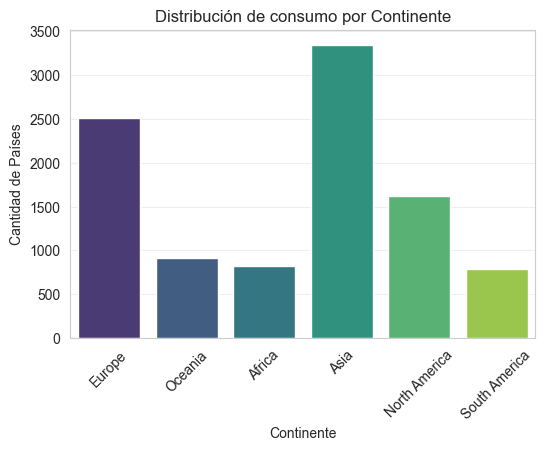

In [26]:
# distribucion de continentes
sns.countplot(x='continent', data=df_raw_data_sugar, palette='viridis')
plt.title("Distribución de consumo por Continente")
plt.xlabel("Continente")
plt.ylabel("Cantidad de Países")
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.3)
plt.show()

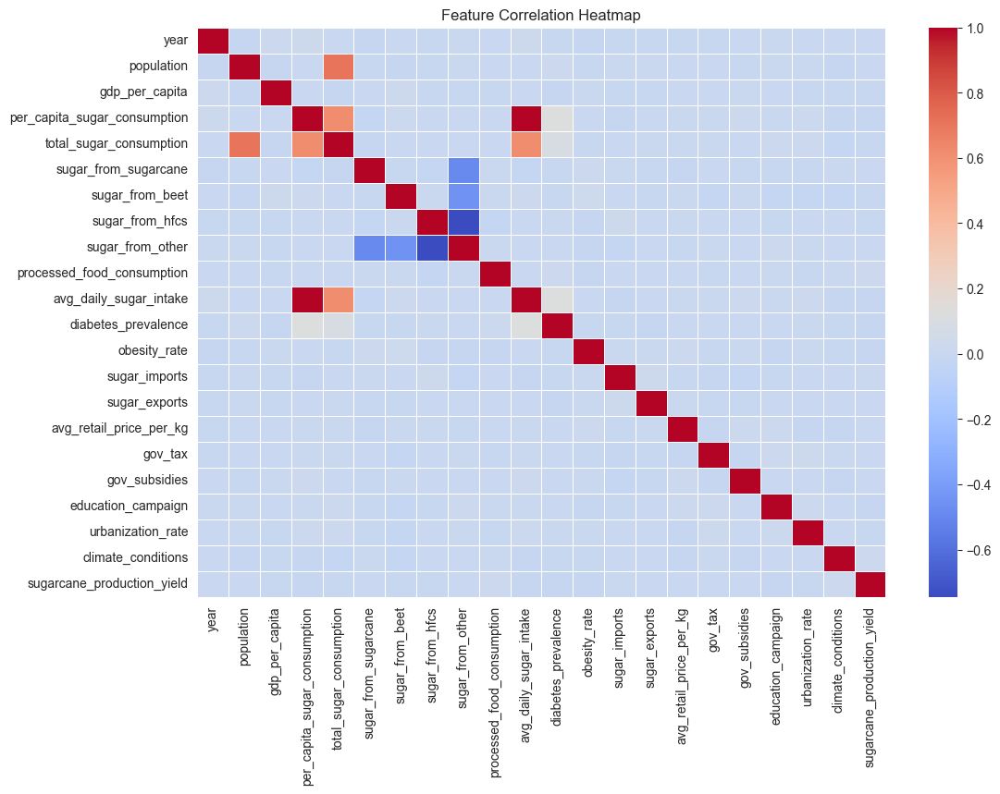

In [27]:
# Correlation heatmap to understand feature relationships
# Select only numerical columns for correlation
numeric_df = df_raw_data_sugar.select_dtypes(include=[np.number])

# Correlation heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(numeric_df.corr(), cmap="coolwarm", annot=False, linewidths=0.5)
plt.title("Feature Correlation Heatmap")
plt.show()

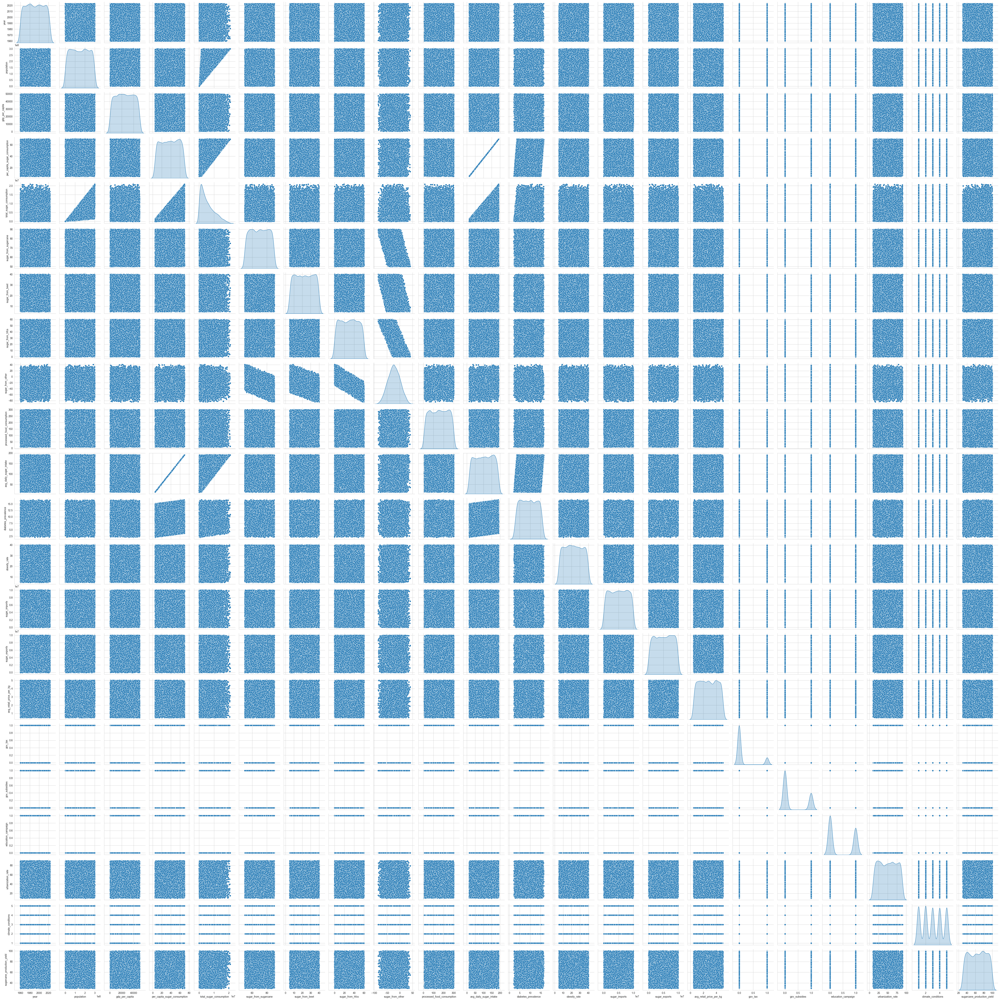

<Figure size 1000x800 with 0 Axes>

In [28]:
# Relación entre variables numéricas

sns.pairplot(df_raw_data_sugar, diag_kind='kde')
plt.figure(figsize=(10, 8))
plt.suptitle('Relación entre Variables Numéricas', y=1.02)
plt.show()

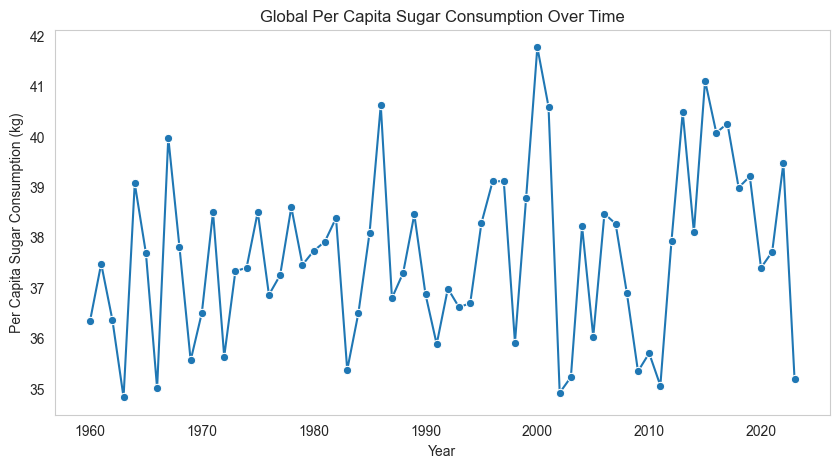

In [32]:
# Visualize sugar consumption trends over the years
plt.figure(figsize=(10, 5))
sns.lineplot(data=df_raw_data_sugar.groupby("year")["per_capita_sugar_consumption"].mean().reset_index(), 
             x="year", y="per_capita_sugar_consumption", marker="o")
plt.title("Global Per Capita Sugar Consumption Over Time")
plt.xlabel("Year")
plt.ylabel("Per Capita Sugar Consumption (kg)")
plt.grid()
plt.show()

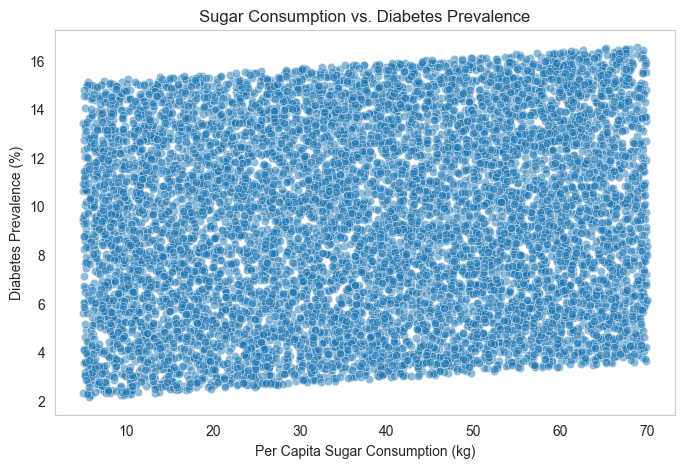

In [102]:
# Relationship between sugar consumption and diabetes prevalence
plt.figure(figsize=(8, 5))
sns.scatterplot(data=df_raw_data_sugar, x="per_capita_sugar_consumption", y="diabetes_prevalence", alpha=0.5)
plt.title("Sugar Consumption vs. Diabetes Prevalence")
plt.xlabel("Per Capita Sugar Consumption (kg)")
plt.ylabel("Diabetes Prevalence (%)")
plt.grid()
plt.show()

# Save cleaned dataset
df_raw_data_sugar.to_csv("cleaned_sugar_consumption_dataset.csv", index=False)


 # Pruebas paramétricas
 ##   pruebas de normalidad

###   Kolmogorov-Simirnov
para comparar la distribución de la muestras con una distribución de referencia

In [97]:
import scipy.stats as stats
# Realizar la prueba de Kolmogórov-Smirnov con la distribución normal estándar
D_stat, p_value = stats.kstest(df['Diabetes_Prevalence'], 'norm')
print(f"Estadística D: {D_stat}")
print(f"P-valor: {p_value}")

Estadística D: 0.9903046115145464
P-valor: 0.0



 ### Shapiro-Wilk
como hay dudas de la normalidad, se decanta por revisar la normalidad con esta prueba

In [93]:
import scipy.stats as stats
numeric_df = df.select_dtypes(include=[np.number])
# Prueba de Shapiro-Wilk
stat, p_value = stats.shapiro(numeric_df.values)
print(f"Statistic: {stat}, p-value: {p_value}")
if p_value > 0.05:
    print("Null hypothesis NOT refused: data DO follow a normal distribution.")
else:
    print("Null hypothesis refused: data are  DON'T follow a normal distribution.")

Statistic: nan, p-value: nan
Null hypothesis refused: data are  DON'T follow a normal distribution.


Resultado de las pruebas de normalidad(Shapiro y Kolmogorov): No existe una normalidad dentro de los datos.

# Prueba de Homegeneidad de varianz

Nos hemos decantado por Levene porque la prueba de Bartlett es más sensible a desviaciones de normalidad en los datos.

### Levene
La prueba de Levene se utiliza para evaluar si las varianzas de dos o más grupos son iguales.

In [98]:
import pandas as pd
import scipy.stats as stats
# Supongamos que tu DataFrame se llama 'df' y tiene las columnas 'Region' y 'Diabetes_Prevalence'
# Crear la tabla de grupos
groups = [df[df['Country'] == country]['Diabetes_Prevalence'] for country in df['Country'].unique()]
# Realizar la prueba de Levene
statistic, p_value = stats.levene(*groups)
print(f"Estadística de Levene: {statistic}")
print(f"P-valor: {p_value}")
# Interpretar el resultado
if p_value < 0.05:
    print("Rechazamos la hipótesis nula: Las varianzas son diferentes entre los grupos.")
else:
    print("No rechazamos la hipótesis nula: Las varianzas son iguales entre los grupos.")

Estadística de Levene: 0.702999090020411
P-valor: 0.7369606770465293
No rechazamos la hipótesis nula: Las varianzas son iguales entre los grupos.


## 4. Análisis Univariante
### 4.1 Estadísticas Descriptivas

Estadísticas descriptivas:
               year    population  gdp_per_capita  per_capita_sugar_consumption  total_sugar_consumption  sugar_from_sugarcane  sugar_from_beet  sugar_from_hfcs  sugar_from_other  processed_food_consumption  avg_daily_sugar_intake  diabetes_prevalence  obesity_rate  sugar_imports  sugar_exports  avg_retail_price_per_kg      gov_tax  gov_subsidies  education_campaign  urbanization_rate  climate_conditions  sugarcane_production_yield
count  10000.000000  1.000000e+04    10000.000000                  10000.000000             1.000000e+04          10000.000000     10000.000000     10000.000000      10000.000000                10000.000000            10000.000000         10000.000000  10000.000000   1.000000e+04   1.000000e+04             10000.000000  9469.000000   10000.000000         9480.000000       10000.000000        10000.000000                10000.000000
mean    1991.330300  1.501189e+08    25242.491756                     37.626027             5.650157e

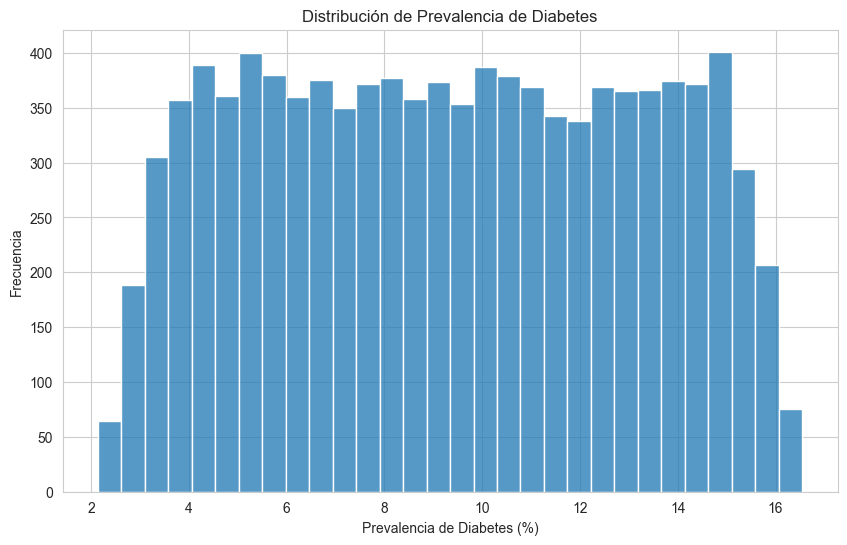

In [12]:
# Estadísticas descriptivas básicas
print("Estadísticas descriptivas:")
print(df_raw_data_sugar.describe())

# Visualización de la distribución de diabetes
plt.figure(figsize=(10, 6))
sns.histplot(data=df_raw_data_sugar, x='diabetes_prevalence', bins=30)
plt.title('Distribución de Prevalencia de Diabetes')
plt.xlabel('Prevalencia de Diabetes (%)')
plt.ylabel('Frecuencia')
plt.show()

## 5. Análisis Bivariante
### 5.1 Correlaciones y Relaciones entre Variables

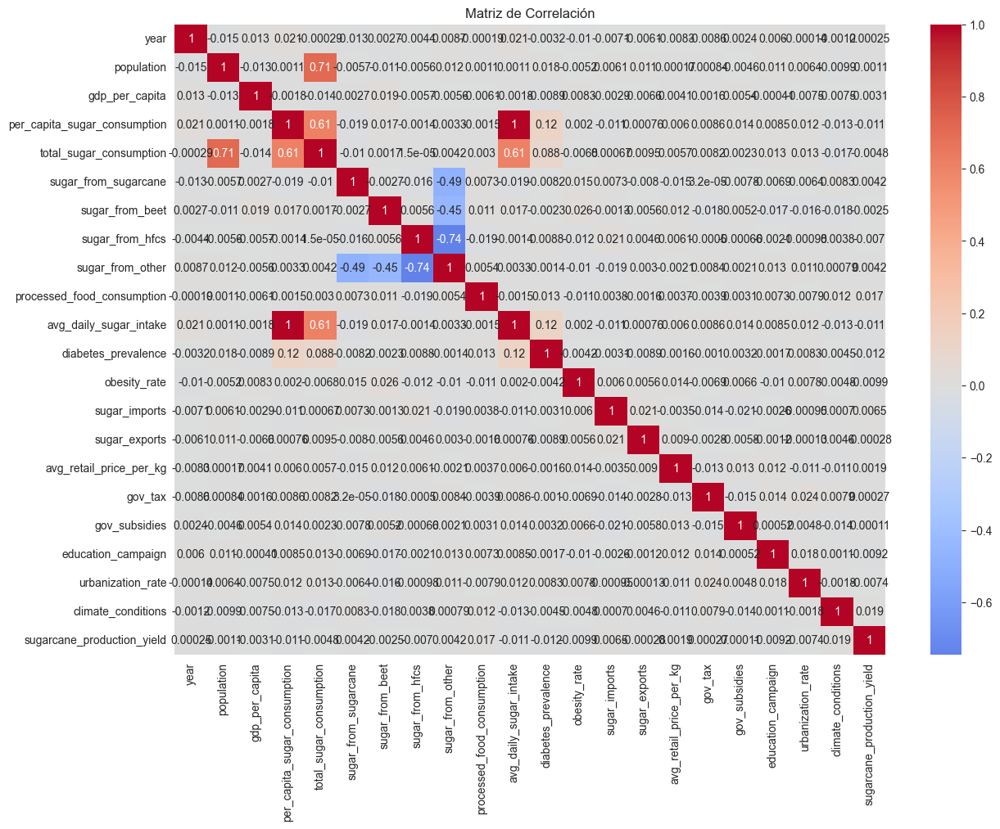

In [16]:
# Matriz de correlación
numeric_columns = df_raw_data_sugar.select_dtypes(include=[np.number]).columns
correlation_matrix = df_raw_data_sugar[numeric_columns].corr()

plt.figure(figsize=(14, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Matriz de Correlación')
plt.show()

## 6. Pruebas Estadísticas
### 6.1 Pruebas de Normalidad y Homogeneidad

In [14]:
# Prueba de Shapiro-Wilk para normalidad
shapiro_test = stats.shapiro(df_raw_data_sugar['diabetes_prevalence'])
print("Prueba de Shapiro-Wilk para diabetes_prevalence:")
print(f"Estadístico: {shapiro_test.statistic:.4f}")
print(f"p-valor: {shapiro_test.pvalue:.4f}")

Prueba de Shapiro-Wilk para diabetes_prevalence:
Estadístico: 0.9594
p-valor: 0.0000


c:\Users\Nhoeli\Desktop\Bootcamp_IA\proyecto_cinco\sugar_rush_regression\.venv\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 10000.
  res = hypotest_fun_out(*samples, **kwds)


In [15]:
# Prueba de Levene para homogeneidad de varianzas
# Dividir en grupos por región para la prueba
regions = df_raw_data_sugar.groupby('region')['diabetes_prevalence'].apply(list)
levene_test = stats.levene(*regions)
print("Prueba de Levene para homogeneidad de varianzas entre regiones:")
print(f"Estadístico: {levene_test.statistic:.4f}")
print(f"p-valor: {levene_test.pvalue:.4f}")

Prueba de Levene para homogeneidad de varianzas entre regiones:
Estadístico: 0.5324
p-valor: 0.8521
